In [1]:
# Store TODAY articles in SQL database

In [23]:
# Import packages
import sqlite3
import pandas as pd
import os
import re
from textacy.preprocessing.resources import RE_URL
import datetime
import matplotlib.pyplot as plt
from wordcloud import WordCloud

In [3]:
from collections import Counter
def count_words(df, column = 'tokens', preprocess = None, min_freq = 2):
    # Process tokens and update counter
    def update(doc):
        tokens = doc if preprocess is None else preprocess(doc)
        counter.update(tokens)
    # Create counter and run through all the data
    counter = Counter()
    df[column].map(str).map(update)
    
    # Transform counter into a Dataframe
    freq_df = pd.DataFrame.from_dict(counter, orient = 'index', columns = ['freq'])
    freq_df = freq_df.query('freq >= @min_freq')
    freq_df.index.name = 'token'
    
    return freq_df.sort_values('freq', ascending = False)

In [4]:
# Import data

# Extract relevant files
onlyfiles = [f for f in os.listdir() if "today_news_scraper_article_v3_" in f and ".csv" in f]

# Bind the relevant files
df = pd.DataFrame()
for item in onlyfiles:
    try:
        df_item = pd.read_csv(item)
    except:
        pass
    df = pd.concat([df, df_item], axis = 0)
    df = df.drop_duplicates(subset = ['Link'], keep = 'first').reset_index(drop = True)
    #print("Filename {} successfully imported and appended to df".format(item))
    

In [5]:
# Setting up database
db_name = "today_news.db"
con = sqlite3.connect(db_name)

# Insert df to database table
df.to_sql("articles", con, index = False, if_exists = "replace") # Save df to database table articles and overwrite any existing data

# Close connection
con.close()

In [43]:
# Extract data from database table articles
con = sqlite3.connect(db_name)
df2 = pd.read_sql("select * from articles", con)
con.close()

In [44]:
print(f"Number of rows: {df2.shape[0]}\nNumber of columns: {df2.shape[1]}")
print(df[['Date','Article']].head())

Number of rows: 1444
Number of columns: 9
         Date                                            Article
0  2020-12-26  SINGAPORE — Singapore reported 10 new cases of...
1  2020-12-26  SINGAPORE — A new year is in sight but old pra...
2  2020-12-26  SINGAPORE — The Ministry of Health (MOH) said ...
3  2020-12-26  SINGAPORE — In 2012, one year after Workers' P...
4  2020-12-26  SINGAPORE — From Jan 1, a total of 18 more mos...


In [45]:
# Data preprocessing pipeline
# (Data Cleaning) SOURCE TEXT -> Identify noise -> Noise removal -> Character normalisation -> Data masking ->
# (Linguistic processing) CLEAN TEXT -> Tokenisation -> POS tagging -> Lemmatisation -> Named-entity recognition ->
# PREPARED TEXT

In [46]:
# Identify noise
import re
def noise_score(text, noise_pattern = re.compile(r'[&#<>{}\[\]\\]'), min_char = 20):
    if text == None or len(text) < min_char:
        return 0
    else:
        output = len(noise_pattern.findall(text))/len(text)
        return output
    
# Add new column to dataframe    
df2['Noise_Score'] = df2['Article'].apply(lambda x: noise_score(x))

# Get top 10 noisy records
df2[['Article','Noise_Score']].sort_values(by = 'Noise_Score', ascending = False).head(10)

,Article,Noise_Score
1260,WASHINGTON — US President Joe Biden said Tuesd...,0.003378
798,SINGAPORE — Three food and beverage (F&B) outl...,0.002291
646,NEW YORK — Johnson & Johnson (J&J) on Friday (...,0.002271
1281,NEW YORK — US President Joe Biden on Wednesday...,0.002209
460,SINGAPORE — Certificate of Entitlement (COE) p...,0.002086
1012,SINGAPORE — Certificate of Entitlement (COE) p...,0.002053
85,SINGAPORE — A karaoke outlet in Orchard Road h...,0.001769
1257,TAIPEI — The de facto US and Canadian embassie...,0.001568
78,SINGAPORE — Deputy Prime Minister and Finance ...,0.001544
524,"SINGAPORE — Tired of working in an office, Ms ...",0.001470


In [47]:
# Remove noise
import html
def noise_remove(text, min_char = 20):
    if text == None or len(text) < min_char:
        return None
    else:
        # Convert html escapes like &amp to &
        text = html.unescape(text)
        # Remove trailing spaces
        text = text.strip()
        # COUNTRYNAME —
        pattern  = re.compile(r'^\w*/*\w*\s*—')
        text = pattern.sub(' ', text)
        # HTML tags
        pattern = re.compile(r'<\w\s*\w*>')
        text = pattern.sub(' ', text)
        # Replace & with and
        pattern = re.compile(r'\s*&\s*')
        text = pattern.sub(' and ', text)
        # Remove trailing spaces
        text = text.strip()
        return text

# Add new column to dataframe
df2['Noise_Remove'] = df2['Article'].apply(noise_remove)

# Get first 10 records
print("First 10 records with noise removed: \n{}".format(df2['Noise_Remove'].head(10)))

# Measure noise
df2['Noise_Remove_Noise_Score'] = df2['Noise_Remove'].apply(noise_score)

# Get top 10 noisy records
print("Top 10 noisy records: \n{}".format(df2[['Noise_Remove','Noise_Remove_Noise_Score']].sort_values(by = 'Noise_Remove_Noise_Score', ascending = False).head(10)))

First 10 records with noise removed: 
0    Singapore reported 10 new cases of Covid-19 on...
1    A new year is in sight but old practices must ...
2    The Ministry of Health (MOH) said on Saturday ...
3    In 2012, one year after Workers' Party (WP) me...
4    From Jan 1, a total of 18 more mosques will of...
5    South Korea posted its second-highest daily nu...
6    Scientists in Singapore are keen to debunk the...
7    One of the new cases of Covid-19 reported on F...
8    Groups of up to eight people will be allowed f...
9    A man who was charged last week with murdering...
Name: Noise_Remove, dtype: object
Top 10 noisy records: 
                                           Noise_Remove  \
1257  The de facto US and Canadian embassies in Taiw...   
78    Deputy Prime Minister and Finance Minister Hen...   
840   GrabPay, Singtel Dash and Liquid Pay users can...   
1216  Activists across Asia held rallies on Sunday (...   
1248  HONG KONG — Fans of several popular K-pop grou...   
8

In [48]:
# Character normalisation
import textacy.preprocessing as tprep

def normalise_text(text):
    if text == None:
        return None
    else:
        text = tprep.normalize_hyphenated_words(text) # Reassembles words that were separated by a line break
        text = tprep.normalize_quotation_marks(text) # Replaces fancy quotation marks with ASCII counterpart
        text = tprep.normalize_unicode(text) # Unifies different codes of accented characters in Unicode
        text = tprep.remove_accents(text) # Replaces accented characters with ASCII if possible, or drops them
        return text
# Add column to df2
df2['Normalise_Text'] = df2['Noise_Remove'].apply(normalise_text)

# Measure noise
df2['Normalise_Text_Noise_Score'] = df2['Normalise_Text'].apply(noise_score)

# Get first 10 records
print("First 10 records with noise removed: \n{}".format(df2['Normalise_Text'].head(10)))

# Get top 10 noisy records
print("Top 10 noisy records: \n{}".format(df2[['Normalise_Text','Normalise_Text_Noise_Score']].sort_values(by = 'Normalise_Text_Noise_Score', ascending = False).head(10)))


First 10 records with noise removed: 
0    Singapore reported 10 new cases of Covid-19 on...
1    A new year is in sight but old practices must ...
2    The Ministry of Health (MOH) said on Saturday ...
3    In 2012, one year after Workers' Party (WP) me...
4    From Jan 1, a total of 18 more mosques will of...
5    South Korea posted its second-highest daily nu...
6    Scientists in Singapore are keen to debunk the...
7    One of the new cases of Covid-19 reported on F...
8    Groups of up to eight people will be allowed f...
9    A man who was charged last week with murdering...
Name: Normalise_Text, dtype: object
Top 10 noisy records: 
                                         Normalise_Text  \
1257  The de facto US and Canadian embassies in Taiw...   
78    Deputy Prime Minister and Finance Minister Hen...   
840   GrabPay, Singtel Dash and Liquid Pay users can...   
1216  Activists across Asia held rallies on Sunday (...   
1248  HONG KONG — Fans of several popular K-pop grou...   

In [49]:
# Data masking
from textacy.preprocessing.resources import RE_URL
count_words(df = df2, column = 'Normalise_Text', preprocess = RE_URL.findall).head(3)

from textacy.preprocessing.replace import replace_urls
df2['Mask_Text'] = df2['Noise_Remove'].map(str).map(replace_urls)
df2['Mask_Normalise_Text'] = df2['Mask_Text'].map(str).map(normalise_text)
print(df2['Mask_Normalise_Text'])

0       Singapore reported 10 new cases of Covid-19 on...
1       A new year is in sight but old practices must ...
2       The Ministry of Health (MOH) said on Saturday ...
3       In 2012, one year after Workers' Party (WP) me...
4       From Jan 1, a total of 18 more mosques will of...
                              ...                        
1439    LOS GATOS — Netflix is testing a feature that ...
1440    South Korea will extend social distancing rule...
1441    SAN FRANCISCO — Twitter is aiming to make its ...
1442    KUALA LUMPUR — Malaysia on Thursday (March 11)...
1443    Prince William on Thursday (March 11) defended...
Name: Mask_Normalise_Text, Length: 1444, dtype: object


In [50]:
df2.rename(columns = {'Article': 'raw_text', 'Mask_Normalise_Text': 'text'}, inplace = True)

con = sqlite3.connect(db_name)
df2.to_sql("articles_cleaned", con, index = False, if_exists = "replace")
con.close()

In [14]:
# Tokenisation

In [15]:
# Linguistic processing with spaCy

In [16]:
# Tokenisation
# Linguistic processing with spaCy
# Import package
import spacy
# Load a small English language model and no need to disable parser and ner (named-entity recognition)
nlp = spacy.load('en_core_web_sm')
# If need to disable, run the following:
# nlp = spacy.load("en_core_web_sm", disable = ["parser", "ner"])
# Check pipeline components
nlp.pipeline

[('tagger', <spacy.pipeline.pipes.Tagger at 0x2123a737948>),
 ('parser', <spacy.pipeline.pipes.DependencyParser at 0x2123a609b28>),
 ('ner', <spacy.pipeline.pipes.EntityRecognizer at 0x2123a609ac8>)]

In [17]:
# Processing text
# Display a table containing the tokens and their attributes from dataframe df2
def show_token_attributes(doc, include_punct = False):
    records = []
    for idx, key in enumerate(doc):
        if not key.is_punct or include_punct: # If token is not a punctuation
            record = {"token": idx,
                     "text": key.text,
                     "lemma_": key.lemma_,
                     "is_stop": key.is_stop,
                     "is_alpha": key.is_alpha,
                     "pos_": key.pos_,
                     "dep_": key.dep_,
                     "ent_type_": key.ent_type_,
                     "ent_iob_": key.ent_iob_}
            records.append(record)
    records_df = pd.DataFrame(records).set_index("token")
    return records_df

In [18]:
# Convert text to document with nlp pipeline from spacy
# Store every one hundred records into one text string
if df2.shape[0] % 100 > 0:
    hundreds = int(df2.shape[0]/100) + 1
else:
    hundreds = int(df2.shape[0]/100)

# Initialise dataframe to store unique records of tokens
records_df = pd.DataFrame()

# Loop over vector of hundreds
for item in range(0, hundreds):
    # Get index of dataframe to start
    start_index = item * 100
    # Get index of dtaaframe to end
    end_index = start_index + 100 if start_index + 100 < df2.shape[0] else df2.shape[0] + 1
    # Subset dataframe
    df_item = df2.iloc[start_index:end_index]
    # Get text for nlp
    text = ' '.join(df_item['text'])
    # Convert text to nlp document
    doc = nlp(text)
    # Show token attributes from document doc as a table of tokens and their associated attributes
    records_df_item = show_token_attributes(doc)
    # Concatenate with main dataframe
    records_df = pd.concat([records_df, records_df_item], axis = 0).reset_index(drop = True)
    # Show progress
    print(f"Number of records processed: {(end_index-1)}")
    
# Remove duplicate records
records_df = records_df.drop_duplicates().reset_index(drop = True)

# Show dataframe
print(f"Number of rows: {records_df.shape[0]}\nNumber of columns: {records_df.shape[1]}")
print(f"First 10 records: {records_df.head(10)}")

# Export dataframe
records_df.to_csv(f"today_news_articles_blueprint_tokens_{datetime.datetime.now().strftime('%Y%m%d%H%M%S')}.csv", index = False)


Number of records processed: 99
Number of records processed: 199
Number of records processed: 299
Number of records processed: 399
Number of records processed: 499
Number of records processed: 599
Number of records processed: 699
Number of records processed: 799
Number of records processed: 899
Number of records processed: 999
Number of records processed: 1099
Number of records processed: 1199
Number of records processed: 1299
Number of records processed: 1334
Number of rows: 102813
Number of columns: 8
First 10 records:         text     lemma_  is_stop  is_alpha   pos_    dep_ ent_type_ ent_iob_
0  Singapore  Singapore    False      True  PROPN   nsubj       GPE        B
1   reported     report    False      True   VERB    ROOT                  O
2         10         10    False     False    NUM  nummod  CARDINAL        B
3        new        new    False      True    ADJ    amod                  O
4      cases       case    False      True   NOUN    dobj                  O
5         o

In [18]:
# Customised tokenisation
from spacy.tokenizer import Tokenizer
from spacy.util import compile_prefix_regex, compile_infix_regex, compile_suffix_regex

def custom_tokeniser(nlp):
    
    # Use default patterns except the patterns matched by re.search
    prefixes = [pattern for pattern in nlp.Defaults.prefixes if pattern not in ["-", "_", "#"]]
    suffixes = [pattern for pattern in nlp.Defaults.suffixes if pattern not in ["_"]]
    infixes = [pattern for pattern in nlp.Defaults.infixes if not re.search(pattern, "xx-xx")]
    
    # Output
    return Tokenizer(vocab = nlp.vocab,
                    rules = nlp.Defaults.tokenizer_exceptions,
                    prefix_search = compile_prefix_regex(prefixes).search,
                    suffix_search = compile_suffix_regex(suffixes).search,
                    infix_finditer = compile_infix_regex(infixes).finditer,
                    token_match = nlp.Defaults.token_match)

In [19]:
# Load English language model
nlp = spacy.load("en_core_web_sm")
nlp.tokenizer = custom_tokeniser(nlp)



In [21]:
# Convert text to document with nlp pipeline from spacy
# Store every one hundred records into one text string
if df2.shape[0] % 100 > 0:
    hundreds = int(df2.shape[0]/100) + 1
else:
    hundreds = int(df2.shape[0]/100)

# Initialise dataframe to store unique records of tokens
records_df = pd.DataFrame()

# Loop over vector of hundreds
for item in range(0, hundreds):
    # Get index of dataframe to start
    start_index = item * 100
    # Get index of dtaaframe to end
    end_index = start_index + 100 if start_index + 100 < df2.shape[0] else df2.shape[0] + 1
    # Subset dataframe
    df_item = df2.iloc[start_index:end_index]
    # Get text for nlp
    text = ' '.join(df_item['text'])
    # Convert text to nlp document
    doc = nlp(text)
    # Show token attributes from document doc as a table of tokens and their associated attributes
    records_df_item = show_token_attributes(doc)
    # Concatenate with main dataframe
    records_df = pd.concat([records_df, records_df_item], axis = 0).reset_index(drop = True)
    # Show progress
    print(f"Number of records processed: {(end_index-1)}")
    
# Remove duplicate records
records_df = records_df.drop_duplicates().reset_index(drop = True)

# Show dataframe
print(f"Number of rows: {records_df.shape[0]}\nNumber of columns: {records_df.shape[1]}")
print(f"First 10 records: {records_df.head(10)}")

# Export dataframe
records_df.to_csv(f"today_news_articles_blueprint_customised_tokens_{datetime.datetime.now().strftime('%Y%m%d%H%M%S')}.csv", index = False)


Number of records processed: 99
Number of records processed: 199
Number of records processed: 299
Number of records processed: 399
Number of records processed: 499
Number of records processed: 599
Number of records processed: 699
Number of records processed: 799
Number of records processed: 899
Number of records processed: 999
Number of records processed: 1099
Number of records processed: 1199
Number of records processed: 1299
Number of records processed: 1334
Number of rows: 104334
Number of columns: 8
First 10 records:         text     lemma_  is_stop  is_alpha   pos_    dep_ ent_type_ ent_iob_
0  Singapore  Singapore    False      True  PROPN   nsubj       GPE        B
1   reported     report    False      True   VERB    ROOT                  O
2         10         10    False     False    NUM  nummod  CARDINAL        B
3        new        new    False      True    ADJ    amod                  O
4      cases       case    False      True   NOUN    dobj                  O
5         o

In [35]:
import textacy
# Creating one function to get it all

# Extracting lemmas based on Part of Speech
# Create function wrapping arounf textacy.extract.words with **kwargs ie keyword arguments
def extract_lemmas(doc, **kwargs):
    # Extract lemmas
    lemmas = [t.lemma_ for t in textacy.extract.words(doc, **kwargs)]
    # Output
    return lemmas

def extract_noun_phrases(doc, preceding_pos = ['NOUN'], sep = "_"):
    patterns = []
    for item in preceding_pos:
        patterns.append(f"POS:{item} POS:NOUN:+")
    # Find noun phrases
    spans = textacy.extract.matches(doc, patterns = patterns)
    # Add separator between lemmas for noun phrase
    noun_phrases = [sep.join(item.lemma_ for item in s) for s in spans]
    # Output
    return noun_phrases

def extract_entities(doc, include_types = ["PERSON", "GPE", "ORG"], sep = "_"):
    # Extract named entities
    ents = textacy.extract.entities(doc,
                                    include_types = include_types,
                                    exclude_types = None,
                                    drop_determiners = True,
                                    min_freq = 1)
    # Named entities
    named_entities = [sep.join([item2.lemma_ for item2 in item]) + '/' + item.label_ for item in ents]
    # Output
    return named_entities

# One-all function
def extract_nlp(doc):
    # Lemmas
    lemmas = extract_lemmas(doc, exclude_pos = ['PART', 'PUNCT', 'DET', 'PRON', 'SYM', 'SPACE'], filter_stops = False)
    # Adjectives verbs
    adjs_verbs = extract_lemmas(doc, include_pos = ['ADJ', 'VERB'])
    # Nouns
    nouns = extract_lemmas(doc, include_pos = ['NOUN'])
    # Noun phrases
    noun_phrases = extract_noun_phrases(doc, ['NOUN'])
    # Adjectives noun phrases
    adj_noun_phrases = extract_noun_phrases(doc, ['ADJ'])
    # Entities
    entities = extract_entities(doc, ['PERSON', 'ORG', 'GPE', 'LOC'])
    # Dictionary
    dict_ = {'lemmas': lemmas,
            'adjs_verbs': adjs_verbs,
            'nouns': nouns,
            'noun_phrases': noun_phrases,
            'adj_noun_phrases': adj_noun_phrases,
            'entities': entities}
    # Output
    return dict_

In [36]:
df2['text'].iloc[0][0]

'Singapore reported 10 new cases of Covid-19 on Saturday (Dec 26), all of which were imported. All 10 cases had been placed on stay-home notices or isolated upon arrival in Singapore, said the Ministry of Health (MOH) in a press release. The total number of Covid-19 cases in Singapore now stands at 58,519. "We are still working through the details of the cases, and further updates will be shared via the MOH press release that will be issued tonight," MOH said. This report will be updated.'

In [37]:
# Run one-all function
text = df2['text'].iloc[0][0]
doc = nlp(text)
for col, values in extract_nlp(doc).items():
    print(f"{col}: {values}")

lemmas: ['Singapore', 'report', '10', 'new', 'case', 'of', 'Covid-19', 'on', 'Saturday', 'Dec', '26', 'of', 'be', 'import', '10', 'case', 'have', 'be', 'place', 'on', 'stay-home', 'notice', 'or', 'isolate', 'upon', 'arrival', 'in', 'Singapore', 'say', 'Ministry', 'of', 'Health', 'MOH', 'in', 'press', 'release', 'total', 'number', 'of', 'covid-19', 'case', 'in', 'Singapore', 'now', 'stand', 'at', '58,519', 'be', 'still', 'work', 'through', 'detail', 'of', 'case', 'and', 'further', 'update', 'will', 'be', 'share', 'via', 'MOH', 'press', 'release', 'will', 'be', 'issue', 'tonight', 'MOH', 'say', 'report', 'will', 'be', 'update']
adjs_verbs: ['report', 'new', 'import', 'place', 'stay-home', 'isolate', 'say', 'total', 'covid-19', 'stand', 'work', 'share', 'issue', 'say', 'update']
nouns: ['case', 'case', 'notice', 'arrival', 'press', 'release', 'number', 'case', 'detail', 'case', 'update', 'press', 'release', 'tonight', 'report']
noun_phrases: ['press_release', 'press_release']
adj_noun_phr

In [41]:
# Create nlp columns
nlp = spacy.load("en_core_web_sm")
nlp_columns = list(extract_nlp(nlp(' ')).keys())
print(nlp_columns)

['lemmas', 'adjs_verbs', 'nouns', 'noun_phrases', 'adj_noun_phrases', 'entities']


In [52]:
# Using spaCy on a large dataset
# Load data
db_name = "today_news.db"
con = sqlite3.connect(db_name)
df = pd.read_sql("select * from articles_cleaned", con)
con.close()
df['text']  = df['Title'] + ":" + df['text']
# Initialise new dataframe columns
for item in nlp_columns:
    df[item] = None
# Check if need GPU
if spacy.prefer_gpu():
    print("Working on GPU.")
else:
    print("No GPU found, working on CPU.")
# Decide which model to use
nlp = spacy.load("en_core_web_sm", disable = [])
# Decide which pipeline components to use
nlp.tokeniser = custom_tokeniser(nlp) # optional
# Apply batch processing to convert text to doc for each record
# Define batch_size
batch_size = 50
# Loop through text data
for i in range(0, len(df), batch_size):
    docs = nlp.pipe(df['text'][i: i+batch_size])
    for j, doc in enumerate(docs):
        for col, values in extract_nlp(doc).items():
            df[col].iloc[i+j] = values

No GPU found, working on CPU.


C:\Users\65961\Desktop\anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


In [54]:
df.head()

,Title,Type,URL,HREF,Name,Date,Datetime,Link,raw_text,Noise_Score,...,Normalise_Text,Normalise_Text_Noise_Score,Mask_Text,text,lemmas,adjs_verbs,nouns,noun_phrases,adj_noun_phrases,entities
0,REUTERS10 new Covid-19 infections in Singapore...,hotnews,https://www.todayonline.com/,/singapore/new-covid-19-cases-dec-26,today,2020-12-26,2020-12-26 17:32:11,https://www.todayonline.com/singapore/new-covi...,SINGAPORE — Singapore reported 10 new cases of...,0.0,...,Singapore reported 10 new cases of Covid-19 on...,0.0,Singapore reported 10 new cases of Covid-19 on...,REUTERS10 new Covid-19 infections in Singapore...,"[reuters10, new, Covid-19, infection, in, Sing...","[reuters10, new, report, new, import, report, ...","[infection, case, hour, case, case, home, noti...","[home_notice, press_release, press_release]","[new_case, new_case, total_number, covid-19_ca...","[Singapore/GPE, Singapore/GPE, Singapore/GPE, ..."
1,Covid-19 not likely to be eradicated like Sars...,hotnews,https://www.todayonline.com/,/singapore/covid-19-not-likely-be-eradicated-s...,today,2020-12-26,2020-12-26 17:32:11,https://www.todayonline.com/singapore/covid-19...,SINGAPORE — A new year is in sight but old pra...,0.0,...,A new year is in sight but old practices must ...,0.0,A new year is in sight but old practices must ...,Covid-19 not likely to be eradicated like Sars...,"[Covid-19, likely, be, eradicate, like, Sars, ...","[likely, eradicate, new, old, hold, firm, conc...","[chief, saysby, hour, year, sight, practice, d...","[chief_saysby, end_game, living_environment, c...","[new_year, old_practice, safe_distancing, long...","[NCID/ORG, Leo_Yee_Sin/PERSON, National_Centre..."
2,MOH orders Concord International Hospital to s...,hotnews,https://www.todayonline.com/,/singapore/moh-orders-concord-international-ho...,today,2020-12-26,2020-12-26 17:32:11,https://www.todayonline.com/singapore/moh-orde...,SINGAPORE — The Ministry of Health (MOH) said ...,0.0,...,The Ministry of Health (MOH) said on Saturday ...,0.0,The Ministry of Health (MOH) said on Saturday ...,MOH orders Concord International Hospital to s...,"[MOH, order, Concord, International, Hospital,...","[suspend, significant, lapses’2, say, order, s...","[order, healthcare, service, hour, provision, ...","[healthcare_service, healthcare_service, savin...","[lapses’2_hour, significant_lapse, private_hos...","[MOH/ORG, Concord_International_Hospital/ORG, ..."
3,WP’s Yee Jenn Jong hopes new book will spark m...,hotnews,https://www.todayonline.com/,/singapore/wps-yee-jenn-jong-hopes-new-book-wi...,today,2020-12-26,2020-12-26 17:32:11,https://www.todayonline.com/singapore/wps-yee-...,"SINGAPORE — In 2012, one year after Workers' P...",0.0,...,"In 2012, one year after Workers' Party (WP) me...",0.0,"In 2012, one year after Workers' Party (WP) me...",WP’s Yee Jenn Jong hopes new book will spark m...,"[WP, Yee, Jenn, Jong, hope, new, book, will, s...","[hope, new, spark, political, run, lose, tell,...","[book, discussion, hour, year, member, alma, m...","[alma_mater, opposition_party, vote_share, par...","[new_book, political_discussion, first_time, s...","[WP/ORG, Yee_Jenn_Jong/PERSON, Workers_'_Party..."
4,"2,950 more spaces for Friday Muslim prayers fr...",hotnews,https://www.todayonline.com/,/singapore/2950-more-spaces-friday-muslim-pray...,today,2020-12-26,2020-12-26 17:32:11,https://www.todayonline.com/singapore/2950-mor...,"SINGAPORE — From Jan 1, a total of 18 more mos...",0.0,...,"From Jan 1, a total of 18 more mosques will of...",0.0,"From Jan 1, a total of 18 more mosques will of...","2,950 more spaces for Friday Muslim prayers fr...","[2,950, more, space, for, Friday, Muslim, pray...","[say, offer, make, available, offer, offer, ma...","[space, prayer, nabilah, awangless, hour, tota...","[nabilah_awangless, end_medium, end_medium_int...","[more_space, more_mosque, more_space, maximum_...","[JUN_SEN/PERSON, nabilah/ORG, Singapore/GPE, M..."


In [56]:
def count_words(df, column='tokens', preprocess=None, min_freq=2):

    # process tokens and update counter
    def update(doc):
        tokens = doc if preprocess is None else preprocess(doc)
        counter.update(tokens)

    # create counter and run through all data
    counter = Counter()
    df[column].map(update)

    # transform counter into data frame
    freq_df = pd.DataFrame.from_dict(counter, orient='index', columns=['freq'])
    freq_df = freq_df.query('freq >= @min_freq')
    freq_df.index.name = 'token'
    
    return freq_df.sort_values('freq', ascending=False)

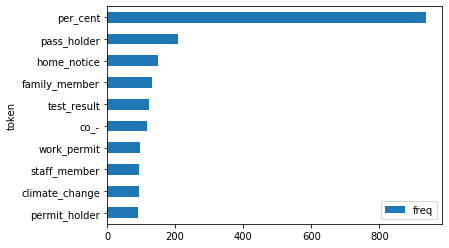

In [57]:
# Bar plot
count_words(df, 'noun_phrases').head(10).plot(kind = 'barh').invert_yaxis()

In [20]:
# Convert text to document with nlp pipeline from spacy
# Store every one hundred records into one text string
def convert_to_doc(df):
    
    # Create copy of dataframe
    df2 = df.copy()
    
    # Split dataframe df into rows of 100 for memory-friendly conversion to doc 
    if df2.shape[0] % 100 > 0:
        hundreds = int(df2.shape[0]/100) + 1
    else:
        hundreds = int(df2.shape[0]/100)

    # Initialise list to store documents
    doc_list = []
        
    # Loop over vector of hundreds
    for item in range(0, hundreds):
        # Get index of dataframe to start
        start_index = item * 100
        # Get index of dtaaframe to end
        end_index = start_index + 100 if start_index + 100 < df2.shape[0] else df2.shape[0] + 1
        # Subset dataframe
        df_item = df2.iloc[start_index:end_index]
        # Get text for nlp
        text = ' '.join(df_item['text'])
        # Convert text to nlp document
        doc = nlp(text)
        # Append to doc list
        doc_list.append(doc)
        # Show progress
        print(f"Number of records processed: {(end_index-1)}")
    
    # Show dataframe
    print(f"Number of elements: {len(doc_list)}")
    print(f"First 10 elements: {doc_list[0:10]}")

    # Output
    return doc_list

In [21]:
doc_list = convert_to_doc(df2)

Number of records processed: 99
Number of records processed: 199
Number of records processed: 299
Number of records processed: 399
Number of records processed: 499
Number of records processed: 599
Number of records processed: 699
Number of records processed: 799
Number of records processed: 899
Number of records processed: 999
Number of records processed: 1099
Number of records processed: 1199
Number of records processed: 1299
Number of records processed: 1399
Number of records processed: 1407
Number of elements: 15


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [22]:
# Working with Stop Words

def remove_stopwords(doc):
    
    # Convert text to nlp class
    doc = nlp(text)
    
    # Extract non-stop words from original nlp
    non_stop = [item for item in doc if not item.is_stop and not item.is_punct]
    
    # List of non-stop words from customised nlp
    nlp.vocab['down'].is_stop = False
    


In [23]:
item_list = []
for item in nlp.vocab:
    item_list.append(item.text)

In [24]:
len(item_list)


10267

In [25]:
# Extracting lemmas based on Part of Speech
text = df2.text.iloc[0]
doc = nlp(text)
print(*[t.lemma_ for t in doc], sep = "|")

Singapore|report|10|new|case|of|Covid-19|on|Saturday|(|Dec|26|)|,|all|of|which|be|import|.|all|10|case|have|be|place|on|stay-home|notice|or|isolate|upon|arrival|in|Singapore|,|say|the|Ministry|of|Health|(|MOH|)|in|a|press|release|.|the|total|number|of|covid-19|case|in|Singapore|now|stand|at|58,519|.|"|-PRON-|be|still|work|through|the|detail|of|the|case|,|and|further|update|will|be|share|via|the|MOH|press|release|that|will|be|issue|tonight|,|"|MOH|say|.|this|report|will|be|update|.


In [26]:
[t.pos_ for t in doc]

['PROPN',
 'VERB',
 'NUM',
 'ADJ',
 'NOUN',
 'ADP',
 'PROPN',
 'ADP',
 'PROPN',
 'PUNCT',
 'PROPN',
 'NUM',
 'PUNCT',
 'PUNCT',
 'DET',
 'ADP',
 'DET',
 'AUX',
 'VERB',
 'PUNCT',
 'DET',
 'NUM',
 'NOUN',
 'AUX',
 'AUX',
 'VERB',
 'ADP',
 'ADJ',
 'NOUN',
 'CCONJ',
 'VERB',
 'SCONJ',
 'NOUN',
 'ADP',
 'PROPN',
 'PUNCT',
 'VERB',
 'DET',
 'PROPN',
 'ADP',
 'PROPN',
 'PUNCT',
 'PROPN',
 'PUNCT',
 'ADP',
 'DET',
 'NOUN',
 'NOUN',
 'PUNCT',
 'DET',
 'ADJ',
 'NOUN',
 'ADP',
 'ADJ',
 'NOUN',
 'ADP',
 'PROPN',
 'ADV',
 'VERB',
 'ADP',
 'NUM',
 'PUNCT',
 'PUNCT',
 'PRON',
 'AUX',
 'ADV',
 'VERB',
 'ADP',
 'DET',
 'NOUN',
 'ADP',
 'DET',
 'NOUN',
 'PUNCT',
 'CCONJ',
 'ADJ',
 'NOUN',
 'VERB',
 'AUX',
 'VERB',
 'ADP',
 'DET',
 'PROPN',
 'NOUN',
 'NOUN',
 'DET',
 'VERB',
 'AUX',
 'VERB',
 'NOUN',
 'PUNCT',
 'PUNCT',
 'PROPN',
 'VERB',
 'PUNCT',
 'DET',
 'NOUN',
 'VERB',
 'AUX',
 'VERB',
 'PUNCT']

In [27]:
# Extracting lemmas based on Part of Speech
# Extract content words
text = df2.text.iloc[0]
doc = nlp(text)
nouns = [t for t in doc if t.pos_ in ['NOUN', 'PROPN']]
print(nouns)

[Singapore, cases, Covid-19, Saturday, Dec, cases, notices, arrival, Singapore, Ministry, Health, MOH, press, release, number, cases, Singapore, details, cases, updates, MOH, press, release, tonight, MOH, report]


In [28]:
# Extract tokens fr adjectives and nouns
import textacy
tokens = textacy.extract.words(doc, 
                              filter_stops = True, # default True, no stopwords
                              filter_punct = True, # default True, no punctuation
                              filter_nums = True, # default False, no numbers
                              include_pos = ['ADJ', 'NOUN'], # default None = include all
                              exclude_pos = None, # default None = exclude none
                              min_freq = 1) # minimum frequency of words
print(*[t for t in tokens], sep = "|")

new|cases|cases|stay-home|notices|arrival|press|release|total|number|Covid-19|cases|details|cases|updates|press|release|tonight|report


In [29]:
# Extracting lemmas based on Part of Speech
# Create function wrapping arounf textacy.extract.words with **kwargs ie keyword arguments
def extract_lemmas(doc, **kwargs):
    return [t.lemma_ for t in textacy.extract.words(doc, **kwargs)]

In [30]:
lemmas = extract_lemmas(doc, include_pos = ['ADJ', 'NOUN'])
print(*lemmas, sep = "|")

new|case|case|stay-home|notice|arrival|press|release|total|number|covid-19|case|detail|case|update|press|release|tonight|report


In [31]:
# Extract lemmas based on Part of Speech
def extract_lemmas_list(doc_list, **kwargs):
    # Initialise list to store lemmas from each document
    lemmas_list = []
    # Initialise num to show progress
    num = 0
    # Loop through list
    for item in doc_list:
        # Extract lemmas
        lemmas_item = [item2.lemma_ for item2 in textacy.extract.words(item, **kwargs)]
        # Append lemmas to list
        lemmas_list.append(lemmas_item)
        # Show progress
        num += 1
        print(f"Lemmas extracted for {num} document(s).")
    # Output
    return lemmas_list

In [32]:
# Extract lemmas based on Part of Speech
lemmas_list = extract_lemmas_list(doc_list, include_pos = ['ADJ', 'NOUN'])

Lemmas extracted for 1 document(s).
Lemmas extracted for 2 document(s).
Lemmas extracted for 3 document(s).
Lemmas extracted for 4 document(s).
Lemmas extracted for 5 document(s).
Lemmas extracted for 6 document(s).
Lemmas extracted for 7 document(s).
Lemmas extracted for 8 document(s).
Lemmas extracted for 9 document(s).
Lemmas extracted for 10 document(s).
Lemmas extracted for 11 document(s).
Lemmas extracted for 12 document(s).
Lemmas extracted for 13 document(s).
Lemmas extracted for 14 document(s).
Lemmas extracted for 15 document(s).


In [33]:
# Plot Wordcloud
def plot_lemmas_wordcloud(lemmas_list):
    # Plot wordcloud
    # Combine elements of list into one list
    # Initialise empty list to store lemmas
    lemmas_wordcloud = []
    num = 0
    # Loop through list
    for item in lemmas_list:
        for item2 in item:
            # Append to list
            lemmas_wordcloud.append(item2)
        # Show progress
        num += 1
        print(f"{num} of {len(lemmas_list)} elements processed.")
    # Plot wordcloud
    # Set tile
    title = '{} Lemmas from TODAY News Articles'.format(len(lemmas_wordcloud))
    # Set figure size
    plt.figure(figsize = (60,40))
    # Create wordcloud object
    wc = WordCloud(max_words = 6000, width = 1800, height = 1000, colormap = 'Set3').generate(' '.join(lemmas_wordcloud))
    # Remove axes
    plt.axis('off')
    plt.title(title, size = 55)
    plt.imshow(wc, interpolation = 'bilinear')
    # Export plot as PNG
    plt.savefig('today_wordcloud_news_articles_blueprint_' + datetime.datetime.now().strftime('%Y%m%d%H%M%S') + '.png')
    # Output
    return lemmas_wordcloud

1 of 15 elements processed.
2 of 15 elements processed.
3 of 15 elements processed.
4 of 15 elements processed.
5 of 15 elements processed.
6 of 15 elements processed.
7 of 15 elements processed.
8 of 15 elements processed.
9 of 15 elements processed.
10 of 15 elements processed.
11 of 15 elements processed.
12 of 15 elements processed.
13 of 15 elements processed.
14 of 15 elements processed.
15 of 15 elements processed.


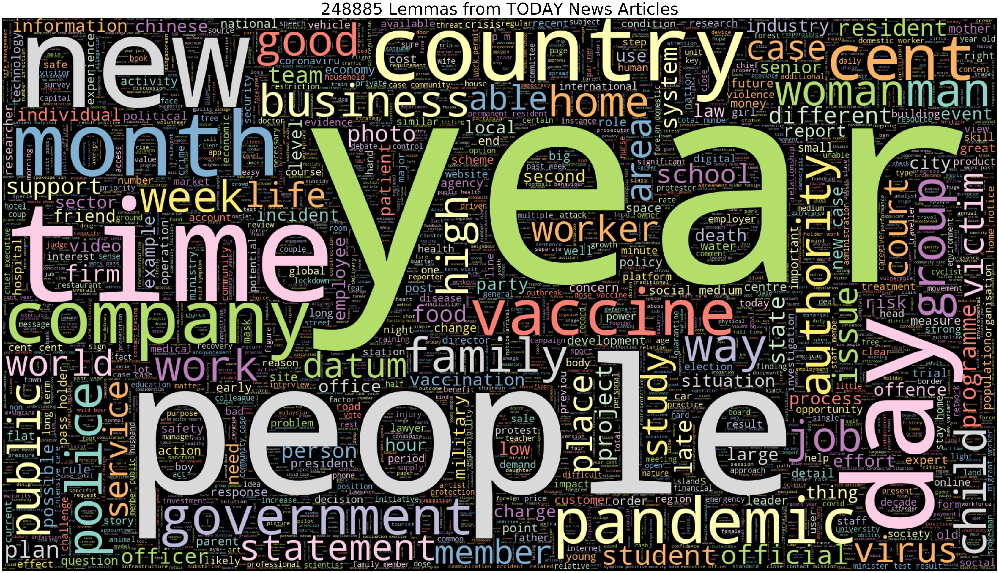

In [34]:
# Plot wordcloud
lemmas_wordcloud = plot_lemmas_wordcloud(lemmas_list)

In [35]:
# Extracting noun phrases
1000 % 100 == 0

True

In [36]:
# Convert text to document with nlp pipeline from spacy
# Store every record into one text string
def convert_to_doc_row(df):
    
    # Create copy of dataframe
    df2 = df.copy()
    
    # Initialise list to store documents
    doc_list = []
        
    # Initialise number to 0 to show progress
    num = 0
    # Loop over rows
    for item in range(0, (df.shape[0])):
        num+= 1
        # Get text for nlp
        text = df['text'].iloc[item]
        # Convert text to nlp document
        doc = nlp(text)
        # Append to doc list
        doc_list.append(doc)
        # Show progress
        if num % 100 == 0:
            print(f"{num} out of {df.shape[0]} records processed.")
    
    # Show dataframe
    print(f"Number of elements: {len(doc_list)}")
    print(f"First 5 elements: {doc_list[0:5]}")

    # Output
    return doc_list

In [37]:
doc_list2 = convert_to_doc_row(df2)

100 out of 1407 records processed.
200 out of 1407 records processed.
300 out of 1407 records processed.
400 out of 1407 records processed.
500 out of 1407 records processed.
600 out of 1407 records processed.
700 out of 1407 records processed.
800 out of 1407 records processed.
900 out of 1407 records processed.
1000 out of 1407 records processed.
1100 out of 1407 records processed.
1200 out of 1407 records processed.
1300 out of 1407 records processed.
1400 out of 1407 records processed.
Number of elements: 1407
First 5 elements: [Singapore reported 10 new cases of Covid-19 on Saturday (Dec 26), all of which were imported. All 10 cases had been placed on stay-home notices or isolated upon arrival in Singapore, said the Ministry of Health (MOH) in a press release. The total number of Covid-19 cases in Singapore now stands at 58,519. "We are still working through the details of the cases, and further updates will be shared via the MOH press release that will be issued tonight," MOH sai

In [38]:
# Extracting noun phrases
test = doc_list2[0]
patterns = ["POS:ADJ POS:NOUN:+"]
spans = textacy.extract.matches(test, patterns = patterns)
#print(*[s.lemma_ for s in spans], sep = "|")
print(['_'.join([t.lemma_ for t in s]) for s in spans])

['new_case', 'stay-home_notice', 'total_number', 'covid-19_case', 'further_update']


In [39]:
# Extract noun phrases from document list
def extract_noun_phrases(doc_list, patterns = ["POS:ADJ POS:NOUN:+"], sep = "_"):
    # Initialise empty list to store noun phrases
    noun_phrases_list = []
    # Initialise num to show progress
    num = 0
    # Loop through doc_list
    for item in doc_list:
        num += 1
        # Find noun phrases
        spans = textacy.extract.matches(item, patterns = patterns)
        # Add separator between lemmas for noun phrase
        noun_phrases = [sep.join(item2.lemma_ for item2 in s) for s in spans]
        # Loop through noun phrases
        for item3 in noun_phrases:
            # Append noun phrase element to list
            noun_phrases_list.append(item3)
        # Show progress
        if num % 100 == 0:
            print(f"{num} out of {len(doc_list)} records processed.")
    # Show list
    print(f"Number of records processed: {len(noun_phrases_list)}")
    print(f"First 10 records:\n{noun_phrases_list[0:10]}")
    # Output
    return noun_phrases_list

In [43]:
noun_phrases_list = extract_noun_phrases(doc_list2)

100 out of 1407 records processed.
200 out of 1407 records processed.
300 out of 1407 records processed.
400 out of 1407 records processed.
500 out of 1407 records processed.
600 out of 1407 records processed.
700 out of 1407 records processed.
800 out of 1407 records processed.
900 out of 1407 records processed.
1000 out of 1407 records processed.
1100 out of 1407 records processed.
1200 out of 1407 records processed.
1300 out of 1407 records processed.
1400 out of 1407 records processed.
Number of records processed: 50260
First 10 records:
['new_case', 'stay-home_notice', 'total_number', 'covid-19_case', 'further_update', 'new_year', 'old_practice', 'safe_distancing', 'long_while', 'protective_measure']


In [41]:
# Plot Wordcloud
def plot_noun_phrases_wordcloud(noun_phrases_list, max_words = 6000):
    # Plot wordcloud
    # Set tile
    title = '{} Noun Phrases from TODAY News Articles'.format(len(noun_phrases_list))
    # Set figure size
    plt.figure(figsize = (60,40))
    # Create wordcloud object
    wc = WordCloud(max_words = max_words, width = 1800, height = 1000, colormap = 'Set3').generate(' '.join(noun_phrases_list))
    # Remove axes
    plt.axis('off')
    plt.title(title, size = 55)
    plt.imshow(wc, interpolation = 'bilinear')
    # Export plot as PNG
    plt.savefig('today_noun_phrases_wordcloud_news_articles_blueprint_' + datetime.datetime.now().strftime('%Y%m%d%H%M%S') + '.png')
    # Output
    return noun_phrases_list

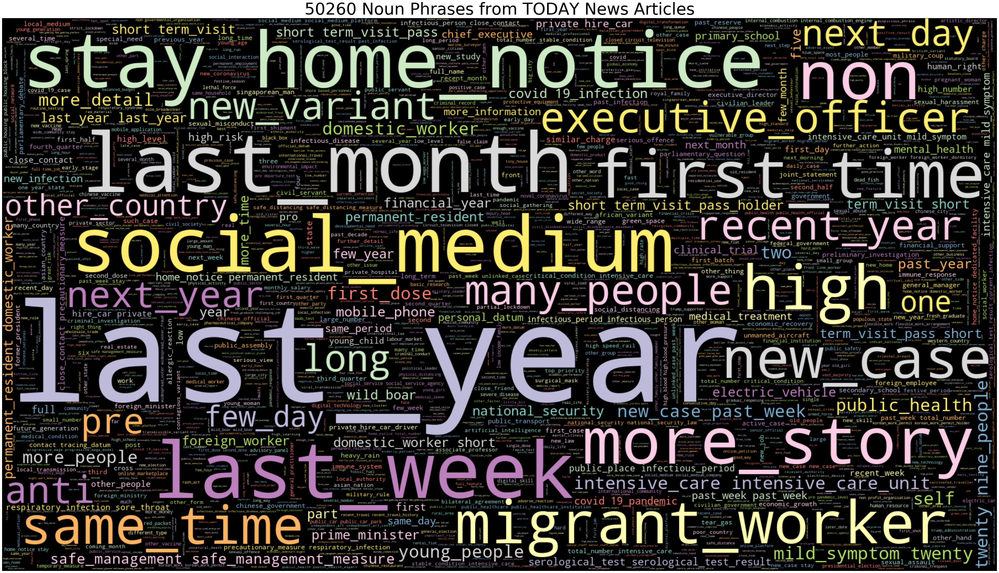

In [42]:
noun_phrases_wordcloud = plot_noun_phrases_wordcloud(noun_phrases_list, max_words = len(noun_phrases_list))

In [46]:
# Exracting named entities
test = doc_list2[0]
#doc = nlp(test)
for item in test.ents:
    print(f"({item.text}, {item.label_})", end = " ")

(Singapore, GPE) (10, CARDINAL) (Saturday, DATE) (Dec 26, DATE) (10, CARDINAL) (Singapore, GPE) (the Ministry of Health, ORG) (MOH, ORG) (Singapore, GPE) (58,519, CARDINAL) (MOH, ORG) (tonight, TIME) (MOH, ORG) 

In [56]:
def extract_named_entities(doc_list, include_types = ["PERSON", "GPE", "ORG"], sep = "_"):
    # Initialise empty list to store named entities
    named_entities_list = []
    # Initialise number to 0 to show progress
    num = 0
    # Loop through document list
    for item in doc_list:
        # Extract named entities
        item_ents = textacy.extract.entities(item,
                                            include_types = include_types,
                                            exclude_types = None,
                                            drop_determiners = True,
                                            min_freq = 1)
        # Named entities
        named_entities = [sep.join([item3.lemma_ for item3 in item2]) + '/' + item2.label_ for item2 in item_ents]
        # Append to list
        for item4 in named_entities:
            named_entities_list.append(item4)
        # Show progress
        num += 1
        if num % 100 == 0:
            print(f"{num} of {len(doc_list)} records processed.")
    # Show output
    print(f"First 20 records:\n{named_entities_list[0:20]}")
    # Output
    return named_entities_list

In [57]:
named_entities_list = extract_named_entities(doc_list2)

100 of 1407 records processed.
200 of 1407 records processed.
300 of 1407 records processed.
400 of 1407 records processed.
500 of 1407 records processed.
600 of 1407 records processed.
700 of 1407 records processed.
800 of 1407 records processed.
900 of 1407 records processed.
1000 of 1407 records processed.
1100 of 1407 records processed.
1200 of 1407 records processed.
1300 of 1407 records processed.
1400 of 1407 records processed.
First 20 records:
['Singapore/GPE', 'Singapore/GPE', 'Ministry_of_Health/ORG', 'MOH/ORG', 'Singapore/GPE', 'MOH/ORG', 'MOH/ORG', 'Leo_Yee_Sin/PERSON', 'National_Centre_for_Infectious_Diseases/ORG', 'NCID/ORG', 'Prof_Leo/PERSON', 'Singapore/GPE', 'Singapore/GPE', 'World_Health_Organization/ORG', 'Singapore/GPE', 'Singapore/GPE', 'AFP_take/ORG', 'Australia/GPE', 'South_Korea/GPE', 'Singapore/GPE']
